# Classification `KNeighborsClassifier`

In [1]:
'''Needed Packages'''
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA
import plotly.graph_objects as go
from astropy.stats import sigma_clip
import warnings
warnings.filterwarnings('ignore')

We have now implemented the classification of the original paper. In order to do this, we have computed the $15$ features using the C program used by authors of the paper.

What we want to implement is a `KNeighborsClassifier`: we use a training set to compute the classifier, then we pick each point of the test set and his label will be the label of its nearest point ($k=1$).

In [2]:
'''Importing Data'''
y = np.loadtxt('labels_C.txt', dtype = str)
path = 'prot_coord_C.txt'
prot = pd.read_csv(path, header = None)
prot['label'] = y
prot = prot.sort_values(by = ['label'], ignore_index = True)
prot = prot.dropna()
prot = prot[prot.label != 'nan']

x = prot[prot.columns[2:17]]
x = np.array(x)
y = prot['label']
y = np.array(y)

## Data processing

Cleaning data using sigma clipping method within $3 \sigma$. This allow us to delete the outlier of a Gaussian shape distribution.

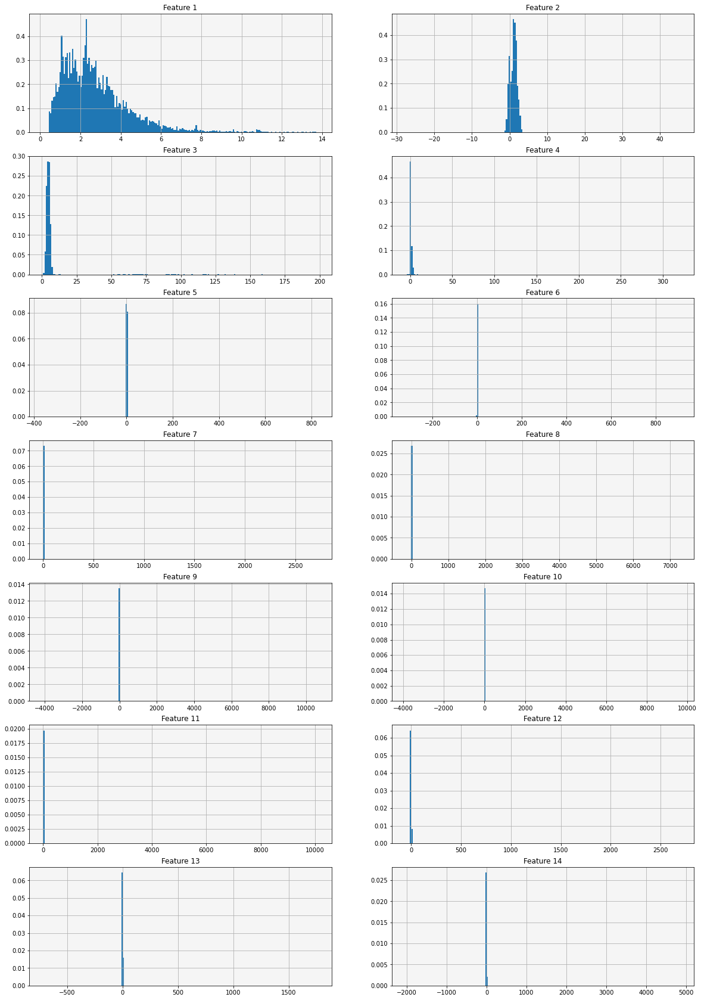

In [3]:
# Data before sigma clipping
fig, axes = plt.subplots(7,2,figsize=(20,30))
k = 0
l = 0
for i in range(1,15):
    axes[l,k].set_title("Feature %d" %i)
    axes[l,k].set_facecolor("whitesmoke") 
    pos = i
    axes[l,k].hist(x[:,pos], bins = 200, density = True)
    axes[l,k].grid()
    k += 1
    if k != 0 and k %2== 0:
        l += 1
        k  = 0

In [4]:
'''Cleaning Data'''

x = sigma_clip(x, sigma=3, masked=False, axis=0)
y = y[~np.isnan(x).any(axis=1)]
x = x[~np.isnan(x).any(axis=1)]


print("X shape after truncation: ", x.shape) 
print("y shape after truncation: ", y.shape)

X shape after truncation:  (56301, 15)
y shape after truncation:  (56301,)


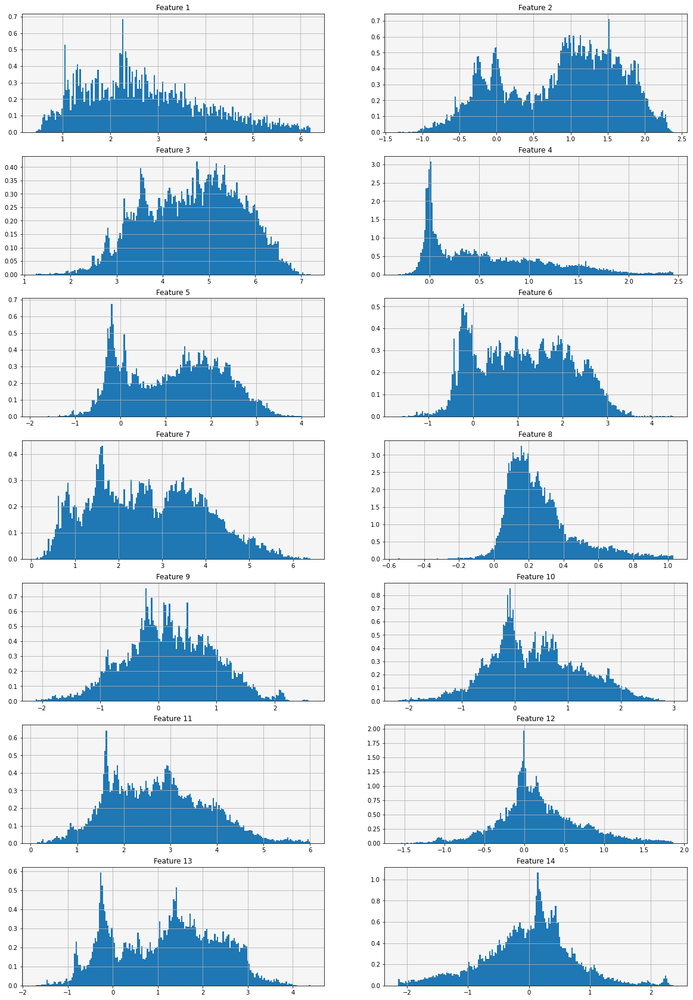

In [5]:
# Data after sigma clipping
fig, axes = plt.subplots(7,2,figsize=(20,30))
k = 0
l = 0
for i in range(1,15):
    axes[l,k].set_title("Feature %d" %i)
    axes[l,k].set_facecolor("whitesmoke") 
    pos = i
    axes[l,k].hist(x[:,pos], bins = 200, density = True)
    axes[l,k].grid()
    k += 1
    if k != 0 and k %2== 0:
        l += 1
        k  = 0

# Classification for the C class

Let's define the labels of our data. We want to cluster the **C** category, so we will have $5$ labels.

In [6]:
y_true = np.zeros(y.shape,dtype=int)
y = y[y != 'nan']
for i in range(len(y)):
    g = y[i].split('.')
    g = g[0]
    y_true[i] = int(g)
    
uniqs, counts = np.unique(y_true,return_counts= True)
print('X shape: ',x.shape)
print("Labels in class C: ", uniqs)
print("Number of proteins in each label: ", counts)

X shape:  (56301, 15)
Labels in class C:  [1 2 3 4 6]
Number of proteins in each label:  [11059 16507 28566   130    39]


In [7]:
# Class indices
_, counts = np.unique(y_true, return_counts = True)
c1 = counts[0]
c2 = c1 + counts[1]
c3 = c2 + counts[2]
c4 = c3 + counts[3]
c6 = c4 + counts[4]

We decided to perform a `StandardScaler` transformation on data because features have different range of values.

In [8]:
x_standard = StandardScaler().fit_transform(x)

### KNeighborsClassifier $k = 1$.

Each point find the nearest neighbors point and join its cluster.

In [9]:
k = 1
# Size of the test set
size = 0.5

We define a loop over the separation of training and test set. This is useful to show that, even if we select few training data, the protein chains naturally separates into fold clusters. So, once identified the cluster centers, the last and only step is to merge each chain into the cluster of the nearest point.

In [10]:
acc = []
split = np.linspace(0.1, 0.9, 9)

for sp in split:
    X_train, X_test, y_train, y_test = train_test_split(x_standard, y_true, test_size=sp, random_state=4)

    # Train Model and Predict
    neigh = KNeighborsClassifier(n_neighbors = k, weights= 'distance', algorithm = 'brute').fit(X_train,y_train)
    Pred_y = neigh.predict(X_test)
    acc.append(metrics.accuracy_score(y_test, Pred_y))

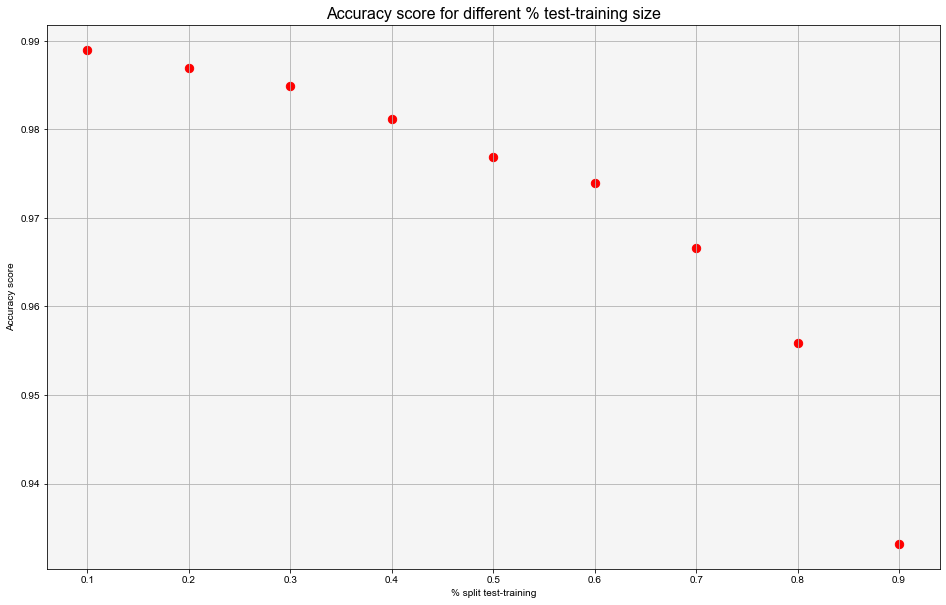

In [11]:
plt.figure(figsize=(16, 10))
font = {
        'size': 16,
        }
plot = plt.scatter(split,acc, color="red", s = 70)
plt.xlabel('% split test-training')
plt.ylabel('Accuracy score')
plt.title('Accuracy score for different % test-training size',fontdict=font)
ax = plt.axes()
plt.style.use('seaborn-ticks')
ax.set_facecolor('whitesmoke')
plt.grid()
plt.show()

We achieve a high score even with just $0.1$% of training size.

From now on, let's fix $0.5$% for the training size.

We show $2$ different Classifier. The first one is obtained using the original data (without scaling), while the second one is achieved using the scaled data.

In [12]:
X_train, X_test, y_train, y_test = train_test_split(x, y_true, test_size = size, random_state = 123)

# Train Model and Predict
neigh = KNeighborsClassifier(n_neighbors = k, weights = 'distance', algorithm = 'brute').fit(X_train, y_train)
Pred_y = neigh.predict(X_test)
print("Accuracy of model at K = 1 is",metrics.accuracy_score(y_test, Pred_y))

Accuracy of model at K = 1 is 0.9234840680615254


In [13]:
X_train, X_test, y_train, y_test = train_test_split(x_standard, y_true, test_size = size, random_state = 123)

# Train Model and Predict
neigh = KNeighborsClassifier(n_neighbors = k, weights = 'distance', algorithm = 'brute').fit(X_train, y_train)
Pred_y = neigh.predict(X_test)
print("Accuracy of model at K = 1 is",metrics.accuracy_score(y_test, Pred_y))

Accuracy of model at K = 1 is 0.9799296650207808


The accuracy of the second model is higher. From now on we will use only the scaled data.

Let's see the results using `PCA` in $2$ and $3$ dimension. We will visualize only the test set and the predicted labels.

In [14]:
label_encoder = LabelEncoder()
color = label_encoder.fit_transform(Pred_y)

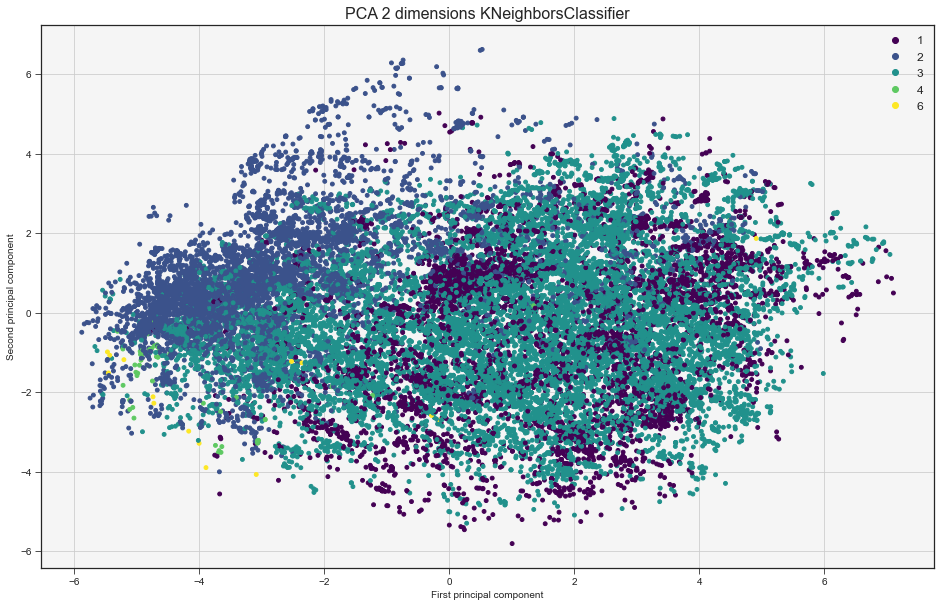

In [15]:
classes=list(np.unique(Pred_y))
font = {
        'size': 16,
        }

pca = PCA(n_components = 2)
pca_res = pca.fit_transform(X_test)

plt.figure(figsize=(16, 10))
plot=plt.scatter(pca_res[:, 0], pca_res[:, 1], c=color, s=15, cmap='viridis')
plt.xlabel('First principal component')
plt.ylabel('Second principal component')
plt.title('PCA 2 dimensions KNeighborsClassifier',fontdict=font)
# Produce a legend with the unique colors from the scatter
plt.legend(handles=plot.legend_elements()[0],labels=classes,loc="upper right",fontsize='12')
ax = plt.axes()
plt.style.use('seaborn-ticks')
ax.set_facecolor('whitesmoke')
plt.grid()
plt.show()


In [16]:
pca = PCA(n_components = 3)
data_embedded = pca.fit_transform(X_test)

fig = go.Figure(data=[go.Scatter3d(
    x=data_embedded[:,0],
    y=data_embedded[:,1],
    z=data_embedded[:,2],
    mode='markers',
    marker=dict(
        size=2,
        color = color,
        colorscale = 'Viridis',
        opacity = 0.7
    )
)])

fig.update_layout(scene = dict(
                    xaxis_title='First principal component',
                    yaxis_title='Second principal component',
                    zaxis_title='Third principal component'),
                    margin=dict(r=20, b=10, l=10, t=10))
fig.show()

# Classification for class A

Re-define the labels.

In [17]:
y_true = np.zeros(y.shape,dtype=int)
y = y[y != 'nan']

for i in range(len(y)):
    g = y[i].split('.')
    g = g[0] + g[1]
    y_true[i] = int(g)

##  $\alpha$ helix

In [18]:
x_1 = x[:c1,:]
y_label = y_true[:c1]
uniqs, counts = np.unique(y_label, return_counts= True)
print('X shape: ',x_1.shape)
print("Labels in class C = 1: ", uniqs)
print("Number of proteins in each label: ", counts)

x_standard = StandardScaler().fit_transform(x_1)

X shape:  (11059, 15)
Labels in class C = 1:  [110 120 125 150]
Number of proteins in each label:  [8613 2092  206  148]


### KNeighborsClassifier $k=1$.

In [19]:
X_train, X_test, y_train, y_test = train_test_split(x_standard, y_label, test_size = size, random_state = 123)

# Train Model and Predict
neigh = KNeighborsClassifier(n_neighbors = k, weights = 'distance', algorithm = 'brute').fit(X_train, y_train)
Pred_y = neigh.predict(X_test)
print("Accuracy of model at K = 1 is",metrics.accuracy_score(y_test, Pred_y))

Accuracy of model at K = 1 is 0.9714285714285714


Let's notice that, from now on, in the plot of the test set there could be less number of classes than the one printed above. This is because some classes have very few samples, so during the split of the dataset it is possible that all the sample went into the training set.

In [20]:
label_encoder = LabelEncoder()
color = label_encoder.fit_transform(Pred_y)

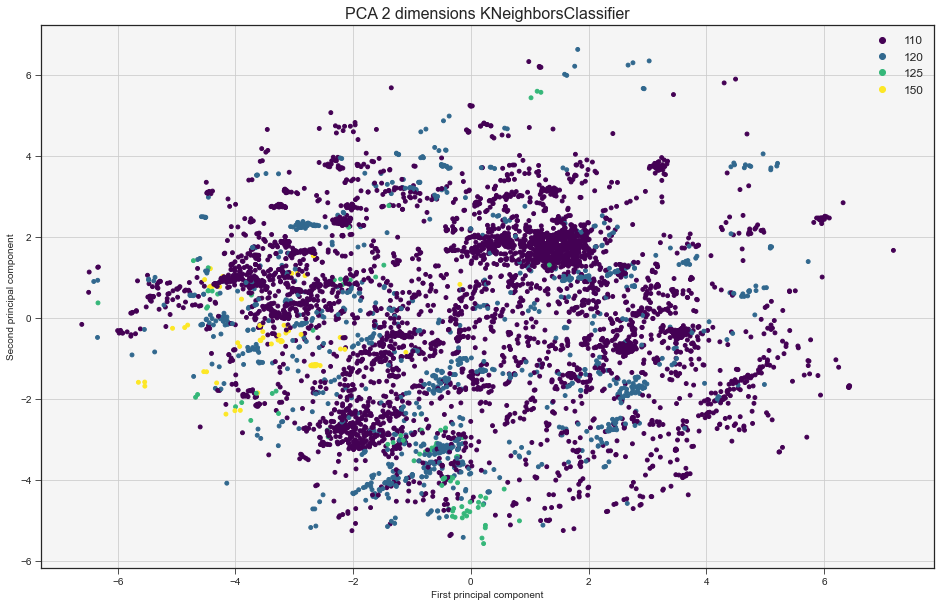

In [21]:
classes=list(np.unique(Pred_y))
font = {
        'size': 16,
        }

pca = PCA(n_components = 2)
pca_res = pca.fit_transform(X_test)

plt.figure(figsize=(16, 10))
plot=plt.scatter(pca_res[:, 0], pca_res[:, 1], c=color, s=15, cmap='viridis')
plt.xlabel('First principal component')
plt.ylabel('Second principal component')
plt.title('PCA 2 dimensions KNeighborsClassifier',fontdict=font)
plt.legend(handles=plot.legend_elements()[0],labels=classes,loc="upper right",fontsize='12')
ax = plt.axes()
plt.style.use('seaborn-ticks')
ax.set_facecolor('whitesmoke')
plt.grid()
plt.show()



In [22]:
pca = PCA(n_components = 3)
data_embedded = pca.fit_transform(X_test)

fig = go.Figure(data=[go.Scatter3d(
    x=data_embedded[:,0],
    y=data_embedded[:,1],
    z=data_embedded[:,2],
    mode='markers',
    marker=dict(
        size=2,
        color = color,
        colorscale = 'Viridis',
        opacity = 0.7
    )
)])

fig.update_layout(scene = dict(
                    xaxis_title='First principal component',
                    yaxis_title='Second principal component',
                    zaxis_title='Third principal component'),
                    margin=dict(r=20, b=10, l=10, t=10))
fig.show()

## $\beta$ sheet

In [23]:
x_1 = x[c1:c2,:]
y_label = y_true[c1:c2]
uniqs, counts = np.unique(y_label, return_counts= True)
print('X shape: ',x_1.shape)
print("Labels in class C = 2: ", uniqs)
print("Number of proteins in each label: ", counts)

x_standard = StandardScaler().fit_transform(x_1)

X shape:  (16507, 15)
Labels in class C = 2:  [ 210  220  230  240  250  260  270  280  290 2100 2102 2110 2115 2120
 2130 2140 2150 2160 2170]
Number of proteins in each label:  [ 713  218 1669 4322   18 7758  591  270   27   65   38   13   46  158
  225    8   10  205  153]


### KNeighborsClassifier $k=1$.

In [24]:
X_train, X_test, y_train, y_test = train_test_split(x_standard, y_label, test_size = size, random_state = 123)

# Train Model and Predict
neigh = KNeighborsClassifier(n_neighbors = k, weights = 'distance', algorithm = 'brute').fit(X_train, y_train)
Pred_y = neigh.predict(X_test)
print("Accuracy of model at K = 1 is",metrics.accuracy_score(y_test, Pred_y))

Accuracy of model at K = 1 is 0.9670462805912285


In [25]:
label_encoder = LabelEncoder()
color = label_encoder.fit_transform(Pred_y)

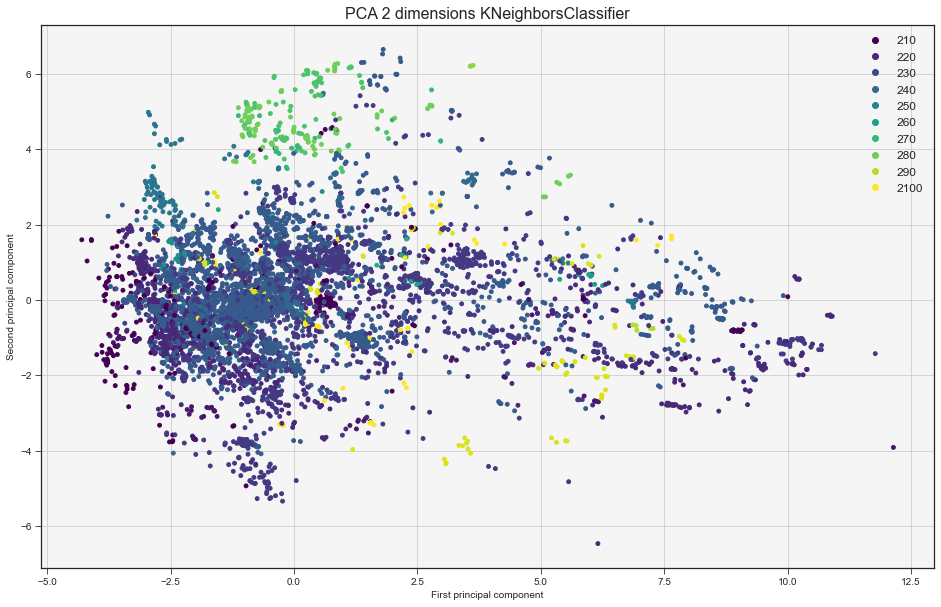

In [26]:
classes=list(np.unique(Pred_y))
font = {
        'size': 16,
        }

pca = PCA(n_components = 2)
pca_res = pca.fit_transform(X_test)

plt.figure(figsize=(16, 10))
plot=plt.scatter(pca_res[:, 0], pca_res[:, 1], c=color, s=15, cmap='viridis')
plt.xlabel('First principal component')
plt.ylabel('Second principal component')
plt.title('PCA 2 dimensions KNeighborsClassifier',fontdict=font)
plt.legend(handles=plot.legend_elements()[0],labels=classes,loc="upper right",fontsize='12')
ax = plt.axes()
plt.style.use('seaborn-ticks')
ax.set_facecolor('whitesmoke')
plt.grid()
plt.show()



In [27]:
pca = PCA(n_components = 3)
data_embedded = pca.fit_transform(X_test)

fig = go.Figure(data=[go.Scatter3d(
    x=data_embedded[:,0],
    y=data_embedded[:,1],
    z=data_embedded[:,2],
    mode='markers',
    marker=dict(
        size=2,
        color = color,
        colorscale = 'Viridis',
        opacity = 0.7
    )
)])

fig.update_layout(scene = dict(
                    xaxis_title='First principal component',
                    yaxis_title='Second principal component',
                    zaxis_title='Third principal component'),
                    margin=dict(r=20, b=10, l=10, t=10))
fig.show()

## $\alpha \beta$

In [28]:
x_1 = x[c2:c3,:]
y_label = y_true[c2:c3]
uniqs, counts = np.unique(y_label, return_counts= True)
print('X shape: ',x_1.shape)
print("Labels in class C = 3: ", uniqs)
print("Number of proteins in each label: ", counts)

x_standard = StandardScaler().fit_transform(x_1)

X shape:  (28566, 15)
Labels in class C = 3:  [ 310  315  320  330  340  350  355  360  365  370  375  380  390 3100]
Number of proteins in each label:  [ 2405     7  2702  6218 11889   295     8  2175    72    76    29    97
  2563    30]


### KNeighborsClassifier $k=1$.

In [29]:
X_train, X_test, y_train, y_test = train_test_split(x_standard, y_label, test_size = size, random_state = 123)

# Train Model and Predict
neigh = KNeighborsClassifier(n_neighbors = k, weights = 'distance', algorithm = 'brute').fit(X_train, y_train)
Pred_y = neigh.predict(X_test)
print("Accuracy of model at K = 1 is",metrics.accuracy_score(y_test, Pred_y))

Accuracy of model at K = 1 is 0.9730448785269201


In [30]:
label_encoder = LabelEncoder()
color = label_encoder.fit_transform(Pred_y)

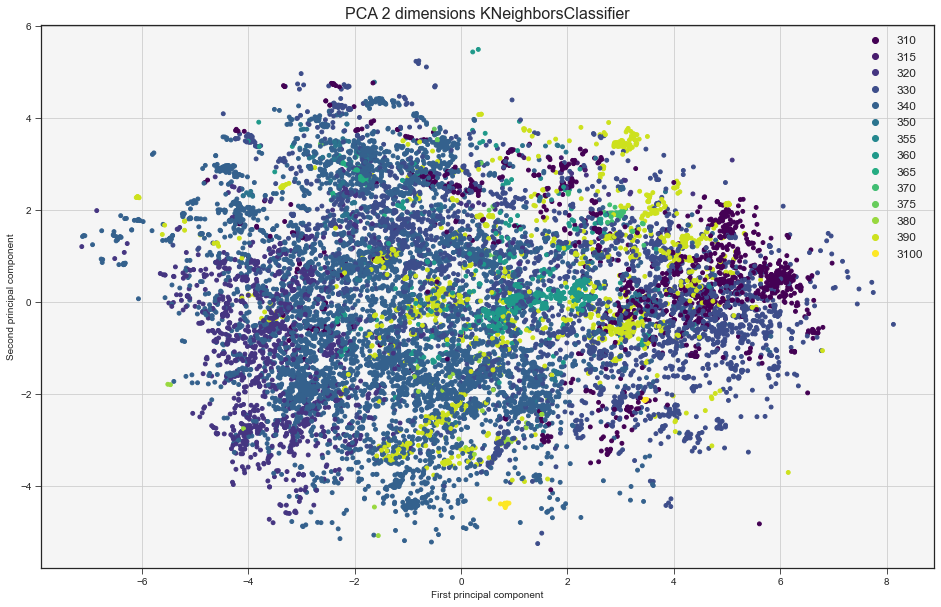

In [31]:
classes=list(np.unique(Pred_y))
font = {
        'size': 16,
        }

pca = PCA(n_components = 2)
pca_res = pca.fit_transform(X_test)

plt.figure(figsize=(16, 10))
plot=plt.scatter(pca_res[:, 0], pca_res[:, 1], c=color, s=15, cmap='viridis')
plt.xlabel('First principal component')
plt.ylabel('Second principal component')
plt.title('PCA 2 dimensions KNeighborsClassifier',fontdict=font)
plt.legend(handles=plot.legend_elements()[0],labels=classes,loc="upper right",fontsize='12')
ax = plt.axes()
plt.style.use('seaborn-ticks')
ax.set_facecolor('whitesmoke')
plt.grid()
plt.show()


In [32]:
pca = PCA(n_components = 3)
data_embedded = pca.fit_transform(X_test)

fig = go.Figure(data=[go.Scatter3d(
    x=data_embedded[:,0],
    y=data_embedded[:,1],
    z=data_embedded[:,2],
    mode='markers',
    marker=dict(
        size=2,
        color = color,
        colorscale = 'Viridis',
        opacity = 0.7
    )
)])

fig.update_layout(scene = dict(
                    xaxis_title='First principal component',
                    yaxis_title='Second principal component',
                    zaxis_title='Third principal component'),
                    margin=dict(r=20, b=10, l=10, t=10))
fig.show()

We just want to show that this method works even when we go inside each class. We won't do the classification T and H for all the categories, but just for one each, in order to show the common results.

# Classification for class T (110)

In [33]:
c1 = y_true[y_true == 110].shape[0]

y_true = np.zeros(c1,dtype=int)
y = y[y != 'nan']
for i in range(c1):
    g = y[i].split('.')
    g = g[0] + g[1] + g[2]
    y_true[i] = int(g)

In [34]:
x_1 = x[:c1,:]
y_label = y_true[:c1]
uniqs, counts = np.unique(y_label, return_counts= True)
print('X shape: ',x_1.shape)
print("Labels in class A = 110: ", uniqs)
print("Number of proteins in each label: ", counts)

x_standard = StandardScaler().fit_transform(x_1)

X shape:  (8613, 15)
Labels in class A = 110:  [   1108   11010   11012   11015   11020   11030   11040   11045   11060
  110101  110110  110132  110135  110140  110150  110155  110166  110167
  110168  110170  110210  110220  110225  110230  110238  110240  110245
  110246  110260  110268  110269  110274  110275  110285  110286  110287
  110288  110290  110300  110340  110357  110375  110390  110400  110405
  110418  110420  110437  110439  110440  110441  110442  110443  110455
  110468  110472  110489  110490  110506  110510  110520  110530  110533
  110540  110555  110560  110565  110575  110579  110590  110600  110606
  110620  110630  110640  110645  110700  110720  110730  110750  110760
  110780  110790  110800  110820  110840  110860  110890  110930  110950
 1101020 1101040 1101050 1101060 1101070 1101080 1101130 1101140 1101160
 1101170 1101200 1101220 1101240 1101280 1101300 1101350 1101370 1101390
 1101400 1101410 1101420 1101500 1101520 1101530 1101580 1101600 1101610
 110

### KNeighborsClassifier $k=1$.

In [35]:
X_train, X_test, y_train, y_test = train_test_split(x_standard, y_label, test_size = size, random_state = 123)

# Train Model and Predict
neigh = KNeighborsClassifier(n_neighbors = k, weights = 'distance', algorithm = 'brute').fit(X_train, y_train)
Pred_y = neigh.predict(X_test)
print("Accuracy of model at K = 1 is",metrics.accuracy_score(y_test, Pred_y))

Accuracy of model at K = 1 is 0.9445089389366148


In [36]:
label_encoder = LabelEncoder()
color = label_encoder.fit_transform(Pred_y)

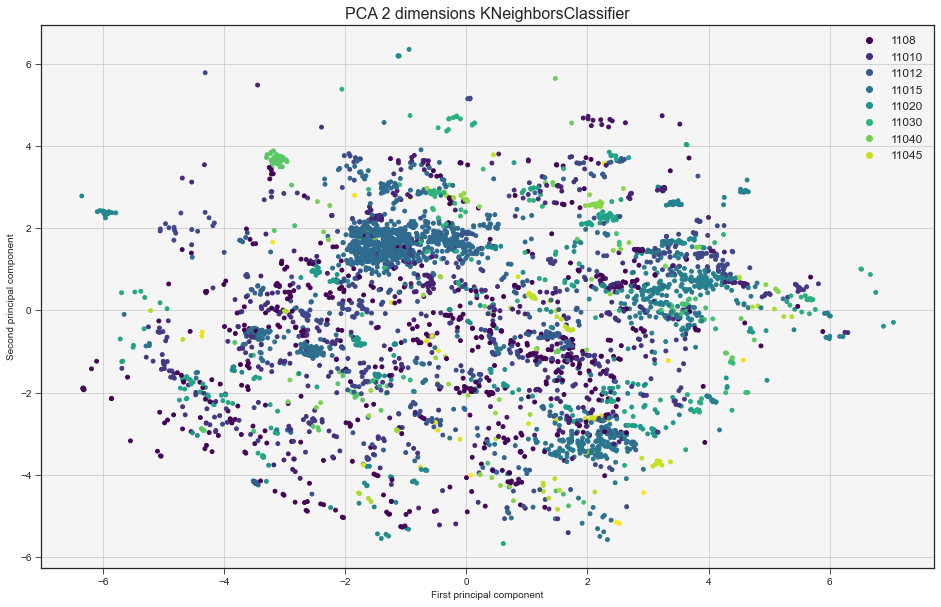

In [37]:
classes=list(np.unique(Pred_y))
font = {
        'size': 16,
        }

pca = PCA(n_components = 2)
pca_res = pca.fit_transform(X_test)

plt.figure(figsize=(16, 10))
plot=plt.scatter(pca_res[:, 0], pca_res[:, 1], c=color, s=15, cmap='viridis')
plt.xlabel('First principal component')
plt.ylabel('Second principal component')
plt.title('PCA 2 dimensions KNeighborsClassifier',fontdict=font)
plt.legend(handles=plot.legend_elements()[0],labels=classes,loc="upper right",fontsize='12')
ax = plt.axes()
plt.style.use('seaborn-ticks')
ax.set_facecolor('whitesmoke')
plt.grid()
plt.show()


In [38]:
pca = PCA(n_components = 3)
data_embedded = pca.fit_transform(X_test)

fig = go.Figure(data=[go.Scatter3d(
    x=data_embedded[:,0],
    y=data_embedded[:,1],
    z=data_embedded[:,2],
    mode='markers',
    marker=dict(
        size=2,
        color = color,
        colorscale = 'Viridis',
        opacity = 0.7
    )
)])

fig.update_layout(scene = dict(
                    xaxis_title='First principal component',
                    yaxis_title='Second principal component',
                    zaxis_title='Third principal component'),
                    margin=dict(r=20, b=10, l=10, t=10))
fig.show()

# Classification for class H (11010)

In [39]:
c1 = y_true[y_true == 11010].shape[0]

y_true = np.zeros(c1,dtype=int)
y = y[y != 'nan']
for i in range(c1):
    g = y[i].split('.')
    g = g[0] + g[1] + g[2] + g[3]
    y_true[i] = int(g)

In [40]:
x_1 = x[:c1,:]
y_label = y_true[:c1]
uniqs, counts = np.unique(y_label, return_counts= True)
print('X shape: ',x_1.shape)
print("Labels in class T = 11010: ", uniqs)
print("Number of proteins in each label: ", counts)

x_standard = StandardScaler().fit_transform(x_1)

X shape:  (631, 15)
Labels in class T = 11010:  [  1101010   1101041   1101060  11010180  11010200  11010250  11010390
  11010400  11010410  11010430  11010460  11010480  11010500  11010520
  11010630  11010640  11010660  11010670  11010740  11010760  11010840
  11010950 110101020 110101050 110101070 110101250 110101320 110101350
 110101410 110101480 110101500 110101590 110101620 110101660 110101690
 110101700 110101710 110101770 110101780 110101790 110101810 110101820
 110101930 110102060 110102120 110102160 110102240 110102390 110102480
 110102490 110102830]
Number of proteins in each label:  [363   7  50   3  29  26   3   3   1   2   7   4   1   4   1   1   4   8
  13   1   4   1   2   6   4   2   4   2   1   9  11   2   1   2   2   3
   1   2   1   1   2   2   9   3   4  10   2   2   2   2   1]


### KNeighborsClassifier $k=1$.

In [41]:
X_train, X_test, y_train, y_test = train_test_split(x_standard, y_label, test_size = size, random_state = 123)

# Train Model and Predict
neigh = KNeighborsClassifier(n_neighbors = k, weights = 'distance', algorithm = 'brute').fit(X_train, y_train)
Pred_y = neigh.predict(X_test)
print("Accuracy of model at K = 1 is",metrics.accuracy_score(y_test, Pred_y))

Accuracy of model at K = 1 is 0.9177215189873418


In [42]:
label_encoder = LabelEncoder()
color = label_encoder.fit_transform(Pred_y)

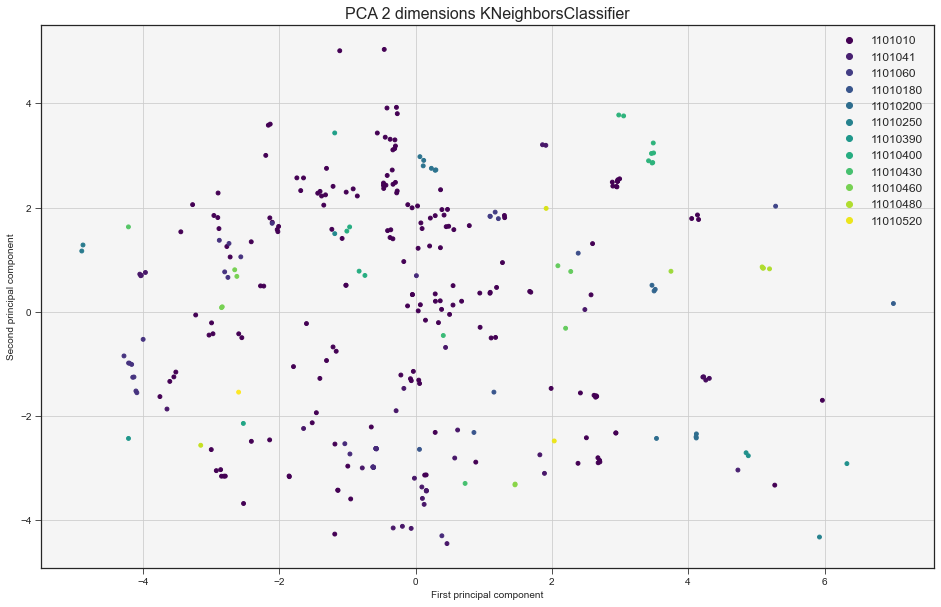

In [43]:
classes=list(np.unique(Pred_y))
font = {
        'size': 16,
        }

pca = PCA(n_components = 2)
pca_res = pca.fit_transform(X_test)

plt.figure(figsize=(16, 10))
plot=plt.scatter(pca_res[:, 0], pca_res[:, 1], c=color, s=15, cmap='viridis')
plt.xlabel('First principal component')
plt.ylabel('Second principal component')
plt.title('PCA 2 dimensions KNeighborsClassifier',fontdict=font)
plt.legend(handles=plot.legend_elements()[0],labels=classes,loc="upper right",fontsize='12')
ax = plt.axes()
plt.style.use('seaborn-ticks')
ax.set_facecolor('whitesmoke')
plt.grid()
plt.show()


In [44]:
pca = PCA(n_components = 3)
data_embedded = pca.fit_transform(X_test)

fig = go.Figure(data=[go.Scatter3d(
    x=data_embedded[:,0],
    y=data_embedded[:,1],
    z=data_embedded[:,2],
    mode='markers',
    marker=dict(
        size=2,
        color = color,
        colorscale = 'Viridis',
        opacity = 0.7
    )
)])

fig.update_layout(scene = dict(
                    xaxis_title='First principal component',
                    yaxis_title='Second principal component',
                    zaxis_title='Third principal component'),
                    margin=dict(r=20, b=10, l=10, t=10))
fig.show()